In [ ]:
#!unzip "drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog Vision/"

__End-to-end multi-class Dog Breed Classification__

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

__##Problem__

Identifying the breed of a dog given an image of a dog.

When I'm sitting at the cafe and I take a photo of dog, I want to know what breed of dog it is.

__##Data__

The data we're using is from Kaggle's dog breed identification competition.


__##Evaluation__

The evaluation is a file with prediction probabilities for each dog breed of each test image.

__##Features__

Some information about the data:

*We're dealing with images(unstructured data) so it's probably best we use deep learning/transfer learning.

*There are 120 breeds of dogs (this means there are 120 different classes).

*There are around 10,000+ images in the training set.(these images have labels).

*There are around 10,000+ images in the test set(these images have no labels, because we'll want to predict them).



###Get our workspace ready

*Import TensorFlow 2.x

*Import TensorFlow Hub

* Make sure we're using a GPU.

In [1]:
!pip install tensorflow
import tensorflow as tf
print("TF version:" , tf.__version__)
import tensorflow_hub as hub
print ("TF Hub version:"  , hub.__version__)
!pip install tf_keras

TF version: 2.17.0
TF Hub version: 0.16.1


In [2]:
import tf_keras as tfk

In [3]:
import tensorflow_hub as hub
print ("TF Hub version:"  , hub.__version__)

#Check for GPU availability
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available:(")

TF Hub version: 0.16.1
GPU available


__Getting our data ready(turning into tensors__

With all machine learning models, our data has to be numerical format .So that's what we'll be doing first. Turning our iages into Tensors(numerical representations).

Let's start by accessing our data and checking out the labels.



In [4]:
#Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
labels_csv.head()

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126


,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: xlabel='breed'>

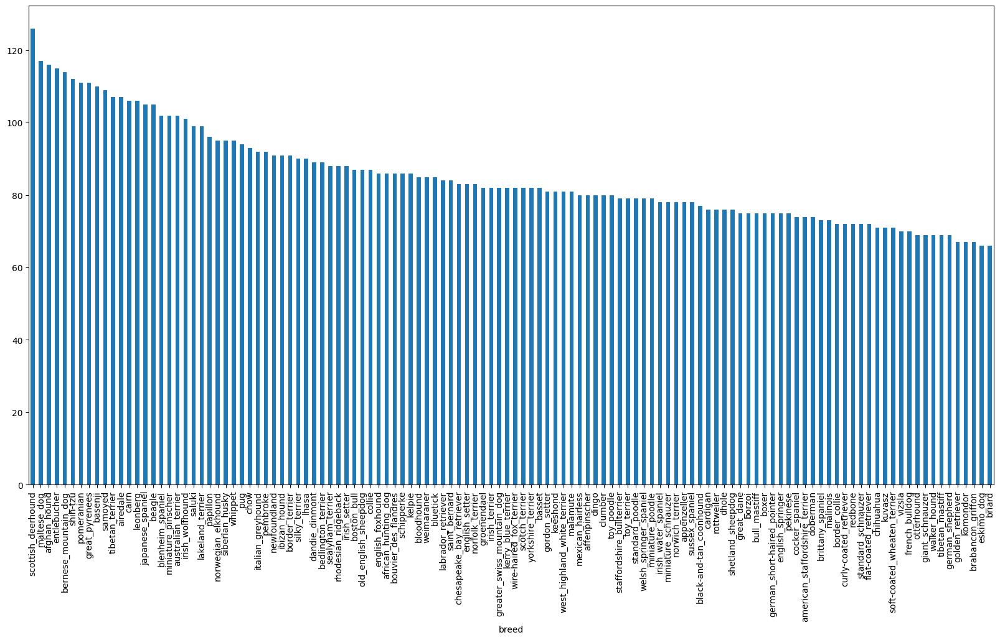

In [5]:
#How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [6]:
labels_csv["breed"].value_counts().median()

82.0

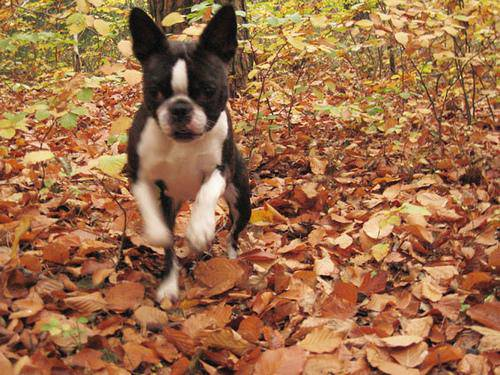

In [7]:
#Lets view an image
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

__Getting images and their labels__

Let's get a list of our image file pathnames

In [8]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [9]:
#Create pathnames from images ids
filenames = ["drive/MyDrive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

#Check the first 10
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [10]:
#Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/MyDrive/Dog Vision/train/")) == len(filenames):
  print("Filenames match actual amount of files!")
else:
  print("Filenames do not match actual amount of files, check data!")

Filenames match actual amount of files!


In [11]:
labels_csv.breed[10000]

'pembroke'

In [12]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [13]:
len(labels)

10222

In [14]:
#See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match number of filenames, check data!")

Number of labels matches number of filenames!


In [15]:
#Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [16]:
#Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [17]:
#Turn every label into the boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [18]:
len(boolean_labels)

10222

In [19]:

#Example: Turning boolean array into integers
print(labels[0]) #Original label
print(np.where(unique_breeds == labels[0])) #Index where label occurs
print(boolean_labels[0].argmax()) #Index where label occurs in boolean array
print(boolean_labels[0].astype(int))# there will be the 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


__Creating our own validation set__

Since the dataset from Kaggle doesn't come with a validation set, we're going to create our own.


In [20]:
#Setup x & y variables
x = filenames
y = boolean_labels

In [21]:

len(filenames)

10222

We're going to start off experimenting with ~1000 images and increase as needed.

In [22]:
#Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}
NUM_IMAGES

1000

In [23]:

#Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

#Split them into training and validation of total size NUM_IMAGES
x_train, x_val, y_train, y_val = train_test_split(x[:NUM_IMAGES],
                                                    y[:NUM_IMAGES],
                                                    test_size=0.2,
                                                    random_state=42)
len(x_train), len(x_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [24]:
#Let's have a look at the traning data
x_train[:5], y_train[:2]

(['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

__Preprocessing Images(turning images into Tensors)__

To preprocess our images into Tensors we're going to write a function which does a few things:

1.Take an image filepath as input.

2. Use TensorFlow to read the file and save it to a variable, image

3. Turn our image(a jpg) into Tensors

4. Resize the image to be a shape of (224,224)

5. Return the modified image

Before start, lets' see what an image looks like.

In [25]:
#Convert image to Numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [26]:
image.min(), image.max()

(0, 255)

In [27]:

tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [28]:
#Define image size
IMG_SIZE = 224

#Create a function for preprocessing images
def process_image(image_path):
  """
  Takes an image file path and turns it into a Tensor.
  """
  #Read in image file
  image = tf.io.read_file(image_path)
  #Turn the jpeg image into numerical Tensor with 3 colour channels(Red, Green, Blue
  image = tf.image.decode_jpeg(image, channels=3)
  #Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  #Resize the image to our desired size(244,244)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
  return image

__Turning our data into batches__

Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go... they all might not fit into memory.

So that's why we do about 32(this is batch size) images at a time (you can manually adjust the batch size if need be).

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this:(image,label).


In [29]:

#Create a simple function to return a tuple (image,label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image,label).
  """
  image = process_image(image_path)
  return image, label

In [30]:
#Demo of the above
(process_image(x[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form:(image,label), let's make a function to turn into batches!

In [31]:
#Define the batch size, 32 is a good start
BATCH_SIZE = 32

#Create a function to turn data into batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input.
  """
  #If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) #only filepaths
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  #If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), #filepaths
                                               tf.constant(y))) #labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
      print("Creating training data batches...")
      #Turn filepaths and labels into Tensors
      data = tf.data.Dataset.from_tensor_slices((tf.constant(x), #filepaths
                                                tf.constant(y))) #labels
      #Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
      data = data.shuffle(buffer_size=len(x))

      #Create (image,label) tuples(this also turns the image path into a preprocessed image)
      data = data.map(get_image_label)

      #Turn the training data into batches
      data_batch = data.batch(BATCH_SIZE)
  return data_batch



In [32]:
#Create training and validation data batches
train_data = create_data_batches(x_train, y_train)
val_data = create_data_batches(x_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [33]:
#Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

__Visualizing data batches__

Our data is now in batches , howevere, these can be a little hard to understand, let's visualize them!

In [34]:
import matplotlib.pyplot as plt
#Create a function for viewing images un a data batch
def show_25_images(images, labels):
  """
  Displays 25 images from a data batch.
  """
  #Setup the figure
  plt.figure(figsize=(10,10))
  #Loop through 25(for displaying 25 images)
  for i in range(25):
    ax = plt.subplot(5,5,i+1)
    #Display an image
    plt.imshow(images[i])
    #Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    #Turn the grid lines off
    plt.axis("off")

In [35]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

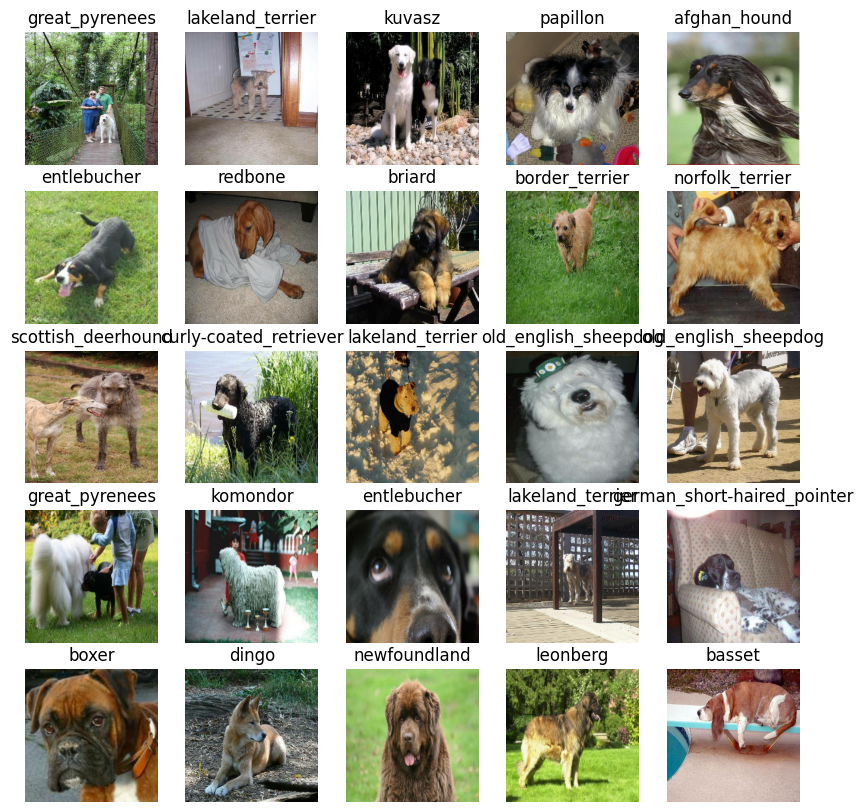

In [36]:
train_images, train_labels = next(train_data.as_numpy_iterator())
len(train_images), len(train_labels)
#Now let's visualize the data in a training batch
show_25_images(train_images, train_labels)

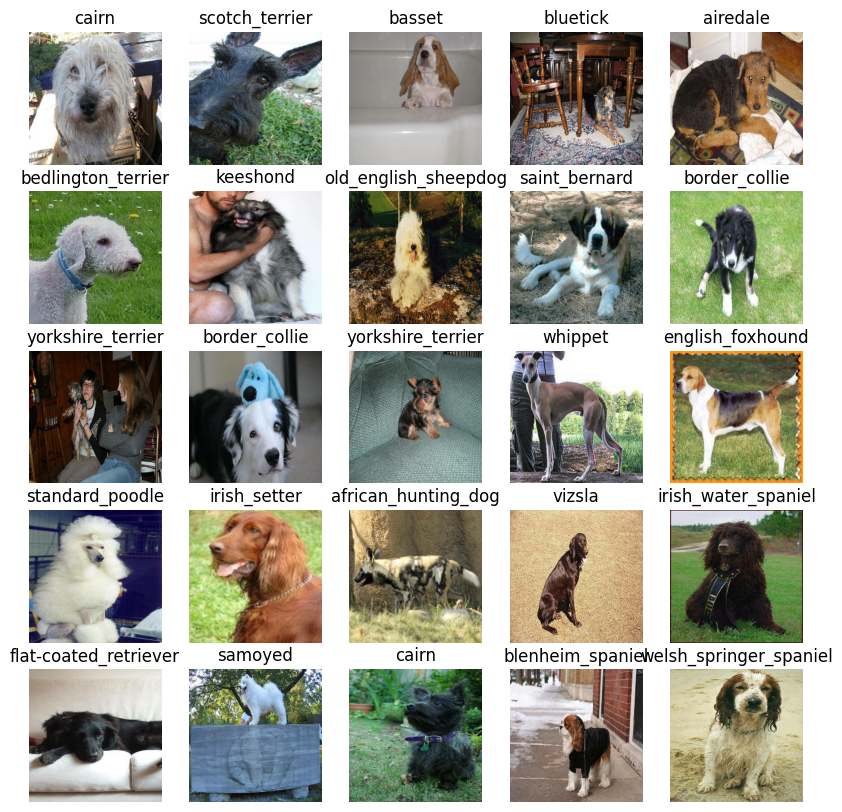

In [37]:
#Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

__Building a model__

Before we build a model there are few things we need to define:



*   The input shape(our images , in the form of Tensors) to our model.
*   The output shape(image labels in the form of Tensors) of our model.
*   The URL of the model we want to use.





In [38]:
IMG_SIZE

224

In [39]:
#Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] #batch, height, width, colour channels
#Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)
#Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

Now we've got our inputs, outputs and model ready to go.

Let's put them together into a Keras deep learning model!

  Knowing this, let's create a function which:

  *Takes the input shape, output shape and the model we've chosen as parameters.

  *Define the layers in the Keras models in sequential fashion(do this first, then this, then that).

  *Compiles the model(says it should be evaluated and improved).

  *Builds the model(tells the model the input shape it'll be getting).

  *Returns the model.

  All of these steps can be found here:https://www.tensorflow.org/guide/keras/overview

In [40]:
import tensorflow_hub as hub
import tensorflow as tf

#Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  #Setup the model layers
  model = tfk.Sequential([
    hub.KerasLayer(model_url), # Layer 1 (input layer)
    tfk.layers.Dense(units=output_shape,
                          activation="softmax") #Layer 2 (output layer)
  ])
  #Compile the model
  model.compile(
      loss=tfk.losses.CategoricalCrossentropy(),
      optimizer=tfk.optimizers.Adam(),
      metrics=["accuracy"]
  )
  model.build(INPUT_SHAPE)

  return model

In [41]:
# Build the model
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


__Creating callbacks__

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create a two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

__TensorBoard Callback__

To setup a TensorBoard callback, we need to do 3 things:

1. Load the TensorBoard notebook extension.

2. Create a TensorBoard callback which is able to save logs to  directory and pass it to our model's fit() function.

3. Visualize our training logs with the %tensorboard magic funtion(we'll do this after model training).

In [42]:
#Load TensorBoard notebook exrension
%load_ext tensorboard

In [43]:
import datetime
from tf_keras.callbacks import ModelCheckpoint, TensorBoard
#Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  #Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/Dog Vision/logs",
                        #Make it so the log get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tfk.callbacks.TensorBoard(logdir)

__Early Stopping Callback__

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

In [44]:
#Create early stopping callback
early_stopping = tfk.callbacks.EarlyStopping(monitor="val_accuracy",
                                                   patience=3)

##Training a model (on subset of data)
Our first model is only going to train on 100 images to make sure everything is working .

In [45]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}



Let's create a function to train and evaluate our model.

* Create a model using create_model().

* Setup a TensorBorad callback using create_tensorboard_callback().

* Call the fit() function on our model passing it the training data, validation data, number of epochs to train for (NUM_EPOCHS) and the callbacks we'd like to use

* Return the model

In [46]:
#Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  #Create a model
  model = create_model()
  #Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  #Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model

  return model



In [47]:
#Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 305s 12s/step - loss: 4.5923 - accuracy: 0.1150 - val_loss: 3.5307 - val_accuracy: 0.2400
Epoch 2/100
25/25 [==============================] - 6s 225ms/step - loss: 1.6508 - accuracy: 0.6812 - val_loss: 2.2549 - val_accuracy: 0.4450
Epoch 3/100
25/25 [==============================] - 5s 197ms/step - loss: 0.5704 - accuracy: 0.9275 - val_loss: 1.7885 - val_accuracy: 0.5500
Epoch 4/100
25/25 [==============================] - 4s 167ms/step - loss: 0.2536 - accuracy: 0.9862 - val_loss: 1.5806 - val_accuracy: 0.6150
Epoch 5/100
25/25 [==============================] - 4s 178ms/step - loss: 0.1485 - accuracy: 0.9987 - val_loss: 1.4896 - val_accuracy: 0.6450
Epoch 6/100
25/25 [==============================] - 6s 221ms/step - loss: 0.1003 - accuracy: 1.0000 - val_loss: 1.4494 - val_accuracy: 0.6250
Epoch 7/100
25/25 [==============================

##Checking the TensorBoard logs

The TensorBoard magic function (%tensorboard) will access the logs directory we create earlier and visualize its content.


In [48]:
%tensorboard --logdir "drive/MyDrive/Dog Vision/logs"



Output hidden; open in https://colab.research.google.com to view.

__Making and evaluating predictions using a traind model__

In [49]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [50]:
#Make predictions on the validation data(not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 113ms/step


array([[1.09853665e-03, 2.44017738e-05, 4.13336849e-04, ...,
        4.78786853e-04, 1.12651702e-04, 1.95864355e-03],
       [6.49570313e-04, 8.96639540e-04, 7.68314628e-03, ...,
        4.43471712e-04, 3.43810022e-03, 6.98811928e-05],
       [4.84400043e-05, 3.53492884e-04, 2.99226900e-04, ...,
        1.43502592e-04, 4.92773470e-05, 4.30334330e-04],
       ...,
       [3.25875590e-05, 9.98469623e-05, 2.09892954e-04, ...,
        2.72264715e-05, 8.63570531e-05, 1.62878292e-04],
       [3.64185940e-03, 1.46346501e-04, 1.19655226e-04, ...,
        1.57470990e-04, 3.42468498e-04, 1.26478346e-02],
       [3.98439728e-03, 3.62921382e-05, 2.42132839e-04, ...,
        7.01715890e-03, 1.26305316e-03, 3.84645173e-05]], dtype=float32)

In [51]:
predictions.shape

(200, 120)

In [52]:
np.sum(predictions[0])

1.0000001

In [53]:
len(y_val)

200

In [54]:
len(unique_breeds)

120

In [55]:
#First prediction
index=42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")


[5.5229379e-04 3.7166593e-04 1.0749706e-04 1.3683952e-04 5.5107241e-03
 1.7217285e-04 2.1727348e-04 3.9783269e-03 2.2129569e-02 5.4273553e-02
 1.7743715e-04 3.3088108e-05 9.7647833e-04 2.9262460e-03 4.7055236e-03
 2.6491752e-03 9.5743715e-05 1.4985509e-03 1.4801334e-04 3.5694288e-04
 5.3454012e-05 1.5717107e-03 7.8842822e-05 1.1831388e-04 8.6487420e-03
 1.9289286e-05 4.5498781e-04 1.4284886e-04 4.4738402e-04 8.6732740e-05
 1.2723640e-05 2.0511459e-04 5.7996447e-05 6.2987281e-05 5.8990259e-05
 2.8484073e-04 1.6075057e-04 1.3083756e-03 4.9568782e-05 4.0716624e-01
 6.4967287e-04 2.0808345e-04 5.1742326e-03 2.5765827e-05 2.9053545e-04
 2.9795989e-05 2.7689955e-04 1.4445899e-03 2.5379891e-04 5.5694382e-04
 3.8729139e-04 3.6680201e-04 2.5841844e-04 1.1661159e-03 1.3271002e-04
 2.4830407e-04 2.0091867e-04 1.4477690e-04 7.2230214e-05 7.7709876e-05
 3.8961621e-04 5.9409294e-04 1.5218490e-05 1.4631957e-04 1.2861898e-04
 1.6662104e-04 2.1740272e-04 4.8299067e-04 1.0663829e-03 4.8975402e-05
 2.006

Havibg the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

__Note:__ Prediction probabilities are also known as confidence levels.

In [56]:
#Turn prediction probabilities into their respective label(easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

#Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'dingo'

In [57]:
#Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image,label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  #Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels
  #Unbatchify the valudation data
  val_images , val_labels = unbatchify(val_data)
  val_images[0], val_labels[0]

Now we've got ways to get:

*Prediction labels

*Validation labels(truth labels)

*Validation images

Let's make some function to make these all a bit more visualize.

We'll create a function which:

* Takes an array of prediction probabilities , an array of truth labels and an array of images and integers.


* Convert the prediction probabilites to a prediction label

*Plot thr predicted label, its predicted probability, the truth label and the target image on a single plot.

In [87]:

def plot_pred(prediction_probabilities, labels, images, n=1):
    """
    View the prediction, ground truth label and image for sample n.
    """
    pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

    # Get the predicted label
    pred_label = get_pred_label(pred_prob)

    # Get the actual label (assuming true_label is one-hot encoded)
    true_label_name = unique_breeds[np.argmax(true_label)]

    # Plot the image & remove ticks
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])

    # Change the color of the title depending on if the prediction is right or wrong
    if pred_label == true_label_name:
        color = "green"
    else:
        color = "red"

    # Change plot title to be the model prediction and the truth label (display the label instead of array)
    plt.title("{} {:2.0f}% (True: {})".format(pred_label,
                                              np.max(pred_prob) * 100,
                                              true_label_name),
              color=color)

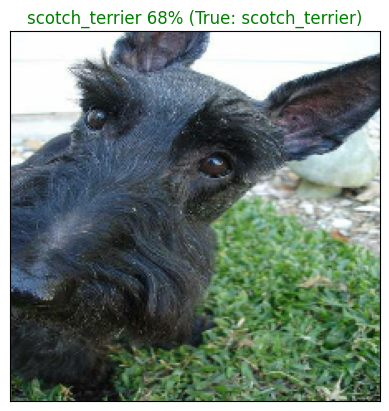

In [88]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images)

**Saving and reloadig a traine dmodel**

In [60]:
#Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix(string).
  """
  #Create a model directory pathname with currenct time
  modeldir = os.path.join("drive/My Drive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [61]:
#Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tfk.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

__Training a big dog model__

In [62]:
len(x) , len(y)

(10222, 10222)

In [63]:
#Create a data batch with the full data set
full_data = create_data_batches(x, y)

Creating training data batches...


In [64]:
#Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [65]:
#Create a full model callbacks
full_model_tensorboard = create_tensorboard_callback()
#No validation set when training on all the data, so we can't monitor validdation accuracy
full_model_early_stopping = tfk.callbacks.EarlyStopping(monitor="accuracy",
                                                      patience=3)

In [66]:
#Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 52s 148ms/step - loss: 1.3549 - accuracy: 0.6668
Epoch 2/100
320/320 [==============================] - 44s 137ms/step - loss: 0.3987 - accuracy: 0.8829
Epoch 3/100
320/320 [==============================] - 48s 149ms/step - loss: 0.2371 - accuracy: 0.9340
Epoch 4/100
320/320 [==============================] - 45s 141ms/step - loss: 0.1525 - accuracy: 0.9646
Epoch 5/100
320/320 [==============================] - 44s 136ms/step - loss: 0.1076 - accuracy: 0.9780
Epoch 6/100
320/320 [==============================] - 44s 138ms/step - loss: 0.0769 - accuracy: 0.9867
Epoch 7/100
320/320 [==============================] - 44s 138ms/step - loss: 0.0576 - accuracy: 0.9921
Epoch 8/100
320/320 [==============================] - 44s 137ms/step - loss: 0.0456 - accuracy: 0.9947
Epoch 9/100
320/320 [==============================] - 43s 134ms/step - loss: 0.0373 - accuracy: 0.9964
Epoch 10/100
320/320 [==============================] - 43s 135m

In [67]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/My Drive/Dog Vision/models/20241023-15261729697219-full-image-set-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/My Drive/Dog Vision/models/20241023-15261729697219-full-image-set-mobilenetv2-Adam.h5'

In [68]:
#Load in the model
loaded_full_model = load_model("drive/MyDrive/Dog Vision/models/20240907-20411725741674-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/Dog Vision/models/20240907-20411725741674-full-image-set-mobilenetv2-Adam.h5


In [69]:
#Load test image filenames
test_path = "drive/MyDrive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Vision/test/f43a0698255ee6f04ad91702a4376b6c.jpg',
 'drive/MyDrive/Dog Vision/test/f409b8113b2c2ab861131c4bd1c0b029.jpg',
 'drive/MyDrive/Dog Vision/test/f59518330db44c70a9bad7e8a4314f3b.jpg',
 'drive/MyDrive/Dog Vision/test/f02b0bb575f8dd86c63ab38df20483ba.jpg',
 'drive/MyDrive/Dog Vision/test/f054f5578e5c9d3f6759b357df3c5f16.jpg',
 'drive/MyDrive/Dog Vision/test/ef69016a79094a8bd47f42ccc14ba63a.jpg',
 'drive/MyDrive/Dog Vision/test/eeb72cc64e4b26bf721196dfcb324e82.jpg',
 'drive/MyDrive/Dog Vision/test/f538a1d1a9e50417ea346429ea3e940c.jpg',
 'drive/MyDrive/Dog Vision/test/ef510b25dc13743d566b719b41b35e92.jpg',
 'drive/MyDrive/Dog Vision/test/f2dd8cf1ced495252a890e6633b65018.jpg']

In [70]:
len(test_filenames)

10357

In [71]:
#Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [72]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [73]:
#Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data, verbose=1)

324/324 [==============================] - 271s 812ms/step


In [74]:
#Save predictions (Numpy array) to csv file(for axxess late)
np.savetxt("drive/MyDrive/Dog Vision/preds_array.csv",
           test_predictions,
           delimiter=",")

In [75]:
#Load predictions (Numpy array) from csv file
test_predictions = np.loadtxt("drive/MyDrive/Dog Vision/preds_array.csv",
                              delimiter=",")

__Preparing our project for submission___

In [76]:
#Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [77]:
#Append test image ID's to prediction DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [78]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,f43a0698255ee6f04ad91702a4376b6c,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,f409b8113b2c2ab861131c4bd1c0b029,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,f59518330db44c70a9bad7e8a4314f3b,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,f02b0bb575f8dd86c63ab38df20483ba,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,f054f5578e5c9d3f6759b357df3c5f16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [79]:
#Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,f43a0698255ee6f04ad91702a4376b6c,1.712070e-06,1.795255e-06,1.947162e-08,3.113674e-09,2.202032e-07,4.582629e-08,1.152809e-08,7.308569e-07,9.550829e-06,...,3.845488e-01,2.986891e-05,2.068559e-06,1.018115e-07,5.756866e-07,6.818256e-09,3.303368e-03,1.092915e-07,3.957953e-07,5.069368e-05
1,f409b8113b2c2ab861131c4bd1c0b029,7.791079e-05,2.147135e-07,1.058466e-07,5.012599e-05,3.024748e-05,5.166836e-05,1.913440e-03,4.486870e-04,1.282878e-04,...,3.884023e-05,1.487253e-04,5.067634e-07,8.166994e-06,5.060603e-07,8.150443e-08,5.527118e-06,1.026045e-03,3.543504e-08,2.801489e-05
2,f59518330db44c70a9bad7e8a4314f3b,1.895482e-10,1.038822e-11,4.181075e-11,3.307158e-06,1.890385e-05,7.433984e-06,3.314387e-05,1.425969e-03,3.583943e-07,...,5.115714e-10,6.351075e-09,2.988260e-09,3.520500e-05,4.879120e-10,1.095891e-08,1.390736e-09,7.078535e-08,3.357848e-06,7.288505e-09
3,f02b0bb575f8dd86c63ab38df20483ba,8.851280e-11,1.388067e-11,9.375426e-10,1.123467e-08,1.125861e-07,9.222139e-04,1.164657e-08,3.045307e-09,2.083070e-09,...,9.550225e-10,5.395139e-11,3.938754e-10,1.422020e-06,1.270144e-09,3.903620e-07,2.280159e-10,1.988720e-08,4.255794e-11,1.531382e-09
4,f054f5578e5c9d3f6759b357df3c5f16,9.222192e-12,4.771172e-11,9.994773e-13,1.184177e-13,4.234739e-11,7.406545e-10,3.734938e-13,9.383279e-09,1.388248e-12,...,2.422353e-11,4.654314e-11,4.058231e-12,1.196777e-12,2.802060e-13,2.390563e-11,1.850994e-11,8.799084e-13,4.609632e-09,1.721220e-09


In [80]:
preds_df.to_csv("drive/MyDrive/Dog Vision/full_model_predictions_submission_1_mobilenetv2.csv", index=False)

__To make predictions on custom images__

*Get the filepaths of our own images.

*Turn the filepaths into data batches using create_data_batches(). And since our custom images won't have labels, we set the test_data parameter to True.

* Pass the custom image data batch to our model's predict() method.

*Convert the prediction output probabilities to predictions labels.

* Compare the predicted labels to the custom images